# Visualization 

In this part of our assignment, we plotted feature matrices resulting from matrix factorization algorithms (matrices U and M) after applying dimensionality reduction algorithms, aiming to represent insights into user preferences and movie characteristics. The output matrices of the matrix factorization algorithm, U and M, have 10 columns and as many rows as the users and movies, respectively. Hence, each row of the output matrices U and M can be mapped with the respective rows of the user features and movie features matrices using the UserIDs and MoviesIDs.
Subsequently, we used dimensionality reduction techniques such as Principal Component Analysis (PCA), t-distributed Stochastic Neighbour Embedding (t-SNE), and Uniform Manifold Approximation and Projection (UMAP) to decrease the data dimensions and access informative visualizations. These methods resulted in interesting visualizations that revealed how users and movies clustered based on factors like age and gender, as well as genre and decade.

Firstly, data are manipulated as in the reccomender_systems file, and then the matrices that the MF algorithm generated and output are read.

## Import Libraries

In [80]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
import chardet
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
import umap
from sklearn.preprocessing import StandardScaler

np.random.seed(42)

In [81]:
import warnings
warnings.filterwarnings("ignore")

## Loading data

It appears that there is inconsistency in the text encoding used in various data files. As a result, we must verify the encoding to ensure accurate data reading from these files.

In [82]:
def get_file_encoding(file_path):
    """
    This function checks the text enconding used in a particular file
    
    :param file_path: The file path you wish to examine for its encoding
    :return: String containing enconding type
    """
    
    with open(file_path, 'rb') as f:
        result = chardet.detect(f.read())
        return result['encoding']

In [83]:
# Loading ratings data
ratings_path = "./ratings.dat"
ratings = pd.read_csv(ratings_path, delimiter="::", header=None, engine='python', encoding=get_file_encoding(ratings_path))
ratings = ratings.rename(columns={0: "UserID", 1: "MovieID", 2: "Rating", 3:"Timestamp"}) # Set ratings column names

ratings.head()

,UserID,MovieID,Rating,Timestamp
0,1,1193,5,978300760
1,1,661,3,978302109
2,1,914,3,978301968
3,1,3408,4,978300275
4,1,2355,5,978824291


In [84]:
#Loading movies data
movies_path = "./movies.dat"
movies = pd.read_csv(movies_path, delimiter="::", header=None, engine='python', encoding= get_file_encoding(movies_path))
movies = movies.rename(columns={0: "MovieID", 1: "Title", 2: "Genres"})

movies.head()

,MovieID,Title,Genres
0,1,Toy Story (1995),Animation|Children's|Comedy
1,2,Jumanji (1995),Adventure|Children's|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama
4,5,Father of the Bride Part II (1995),Comedy


In [85]:
#Loading users data
users_path = "./users.dat"
users = pd.read_csv(users_path, delimiter="::", header=None, engine='python', encoding= get_file_encoding(users_path))
users = users.rename(columns={0: "UserID", 1: "Gender", 2: "Age", 3: "Occupation", 4: "Zip-code"})

users.head()

,UserID,Gender,Age,Occupation,Zip-code
0,1,F,1,10,48067
1,2,M,56,16,70072
2,3,M,25,15,55117
3,4,M,45,7,02460
4,5,M,25,20,55455


## Pre-processing Data

In [86]:
le = LabelEncoder()

In [87]:
unique_users_ids = ratings['UserID'].unique()
# Assuming your movies features matrix is named 'movies_features_df'
filtered_users = users[users['UserID'].isin(unique_users_ids)]

unique_movies_ids = ratings['MovieID'].unique()
# Assuming your movies features matrix is named 'movies_features_df'
filtered_movies = movies[movies['MovieID'].isin(unique_movies_ids)]


filtered_movies.loc[:, 'MovieID'] = le.fit_transform(filtered_movies['MovieID'])
filtered_users.loc[:, 'UserID'] = le.fit_transform(filtered_users['UserID'])

In [88]:
filtered_movies.reset_index(drop=True, inplace=True)
filtered_users.reset_index(drop=True, inplace=True)

In [89]:
user_movie_ratings = ratings.pivot(index='UserID', columns='MovieID', values='Rating').fillna(0)

In [90]:
# Encode columns (MovieIDs)
user_movie_ratings.columns = le.fit_transform(user_movie_ratings.columns)

# Encode row names (UserIDs)
user_movie_ratings.index = le.fit_transform(user_movie_ratings.index)

## Reading the marices and preprocess them

The movies' genres were chosen to be divided into 6 categories according to some individual beliefs: 
1. Combined: the movies with more than one genre
2. Positive Genre Categories: Musical, Romance, Comedy and Fantasy
3. Negative Genre Categories: Drama, Western, Horror, Thriller and War 
4. Sci-Fi/Fantasy: Sci-Fi and Fantasy movies
5. Action and Adventure: Action and Adventure
6. Children's Genres: Children and Animation

So, a new column was created, named Categories in which the genres were mapped to the specific category. 
Moreover, the years were mapped to a new column named Decade to the specific decade they were released so as to have fewer clusters.

In [91]:
U=read_matrix = np.loadtxt('users_mf.csv', delimiter=',')
M=read_matrix = np.loadtxt('movies_mf.csv', delimiter=',')

In [92]:
#function to categorize years into s
def categorize_decade(year):
    return f'{year // 10 * 10}s'

In [93]:
movies_df=filtered_movies.copy()
movies_df['Year'] = movies_df['Title'].str.extract(r'\((\d{4})\)')
movies_df=movies_df[['MovieID', 'Genres', 'Year']]
movies_df.loc[:,'Year'] = movies_df.loc[:,'Year'].astype(int)
movies_df.loc[:,'Year'] = movies_df.loc[:,'Year'].astype(int)
movies_df.loc[:,'Decade'] = movies_df.loc[:,'Year'].apply(categorize_decade)


users_df=filtered_users[["UserID", "Gender", "Age"]].copy()

In [94]:
age = users_df["Age"].values

gender_mapping = {"M": 0, "F": 1}
users_df["Gender1"] = users_df["Gender"].map(gender_mapping)

# Now, you can stack the "Age" and "Gender1" columns to the existing array U
age = users_df["Age"].values
gender = users_df["Gender1"].values


In [95]:
# Function to categorize genres
def categorize_genre(genre):
    if '|' in genre:
        return 'Combinations'
    elif 'Drama' in genre or 'Western' in genre or 'Horror' in genre or 'Thriller' in genre or 'War' in genre:
        return 'Negative Genre Categories'
    elif 'Children\'s' in genre or 'Animation' in genre:
        return "Children's Genres"
    elif 'Musical' in genre or 'Romance' in genre or 'Comedy' in genre or 'Fantasy' in genre :
        return 'Positve Genre Categories'
    elif 'Sci-Fi' in genre or 'Fantasy' in genre:
        return 'Sci-Fi/Fantasy'
    elif 'Action' in genre or 'Adventure' in genre:
        return 'Action and Adventure'
    else:
        return 'Others'

# Apply the categorize_genre function to the 'Genres' column and create a new column ''
movies_df['Category'] = movies_df['Genres'].apply(categorize_genre)



In [96]:
genre_mapping = {x: y for y, x in enumerate(movies_df["Category"].unique())}
decade_mapping = {x: y for y, x in enumerate(movies_df["Decade"].unique())}

movies_df["Genre1"] = movies_df["Category"].map(genre_mapping)
movies_df["Decade1"] = movies_df["Decade"].map(decade_mapping)

genre = movies_df["Genre1"].values

decade = movies_df["Decade1"].values


In [97]:
movies_df

,MovieID,Genres,Year,Decade,Category,Genre1,Decade1
0,0,Animation|Children's|Comedy,1995,1990s,Combinations,0,0
1,1,Adventure|Children's|Fantasy,1995,1990s,Combinations,0,0
2,2,Comedy|Romance,1995,1990s,Combinations,0,0
3,3,Comedy|Drama,1995,1990s,Combinations,0,0
4,4,Comedy,1995,1990s,Positve Genre Categories,1,0
...,...,...,...,...,...,...,...
3701,3701,Comedy,2000,2000s,Positve Genre Categories,1,9
3702,3702,Drama,2000,2000s,Negative Genre Categories,3,9
3703,3703,Drama,2000,2000s,Negative Genre Categories,3,9
3704,3704,Drama,2000,2000s,Negative Genre Categories,3,9


So, now the two dataframes of users (with columns of interest being userID, gender and age) and of movies (with columns of interest regarding moviesID, Category and Decade) ara going to be used for the visualizations.

# Plots

The following procedures were implemented during all dimensionality reduction algorithms used and they are the same for both users and movies:

In the first procedure, PCA, t-SNE, or UMAP on the output matrix U (or M), that corresponds to users (or movies), to reduce its columns to 2. These reduced dimensions were then concatenated with user or movie attributes (for users: gender and age, for movies: genre, and decade) so that the points could be colored according to them. Use of the seaborn and matplotlib library to visualize the output of the algorithm.

In the second procedure, an additional column was added to the output matrix U corresponding to the feature to be visualized and then the algorithms for dimensionality reduction were applied to this updated matrix to reduce dimensions to 2. Again, these reduced dimensions were then concatenated with user or movie attributes (for users: gender and age, for movies: genre and decade) so that the points could be colored according to them. Use of the seaborn and matplotlib library to visualize the output of the algorithm.


The first and second methods' results were shown side by side to demonstrate the influence of feature weighting. While the second procedure may be deemed non-standard, the reason for implementing it is to show that without weighting the columns of the algorithm's output matrices, there are no specific patterns neither in the users according to their genders and ages nor in the movies according to genres and decades. On the other hand, after weighting the matrices the patterns become rather clear in almost all the cases.

## PCA

### Users

#### Gender

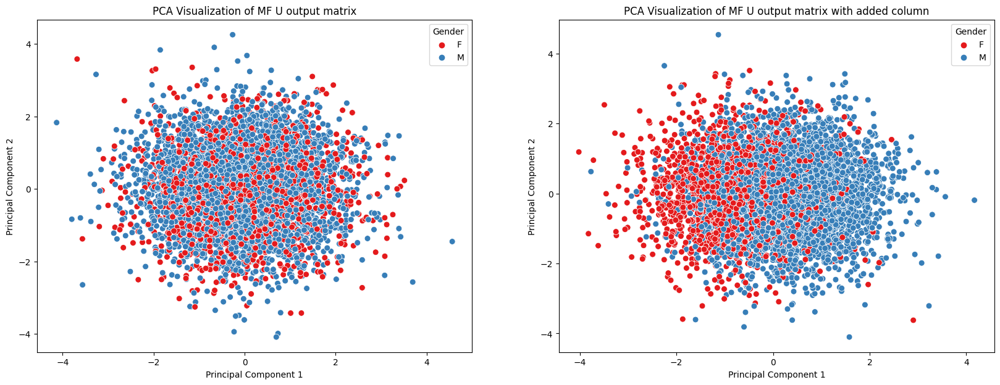

In [98]:
## without adding extra column
std_scaler = StandardScaler()
scaled_df = std_scaler.fit_transform(U)
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_df)

pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'], index=users_df['UserID'])

final_df1 = pd.concat([pca_df, users_df[['Gender']]], axis=1)

## added extra gender column
U_updated = np.column_stack((U, gender))

# Standardize the data
std_scaler = StandardScaler()
scaled_df = std_scaler.fit_transform(U_updated)
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_df)
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'], index=users_df['UserID'])

final_df2 = pd.concat([pca_df, users_df[['Gender']]], axis=1)

# Visualize using seaborn

plt.figure(figsize=(20, 7))
plt.subplot(1, 2, 1) 
sns.scatterplot(x='PC1', y='PC2', hue='Gender', data=final_df1, palette='Set1', s=50)
plt.title('PCA Visualization of MF U output matrix')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

# using the updated matrix
plt.subplot(1, 2, 2) 
sns.scatterplot(x='PC1', y='PC2', hue='Gender', data=final_df2, palette='Set1', s=50)
plt.title('PCA Visualization of MF U output matrix with added column')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

For the gender variable, we observe a trend between males and females in the right plot.

#### Age

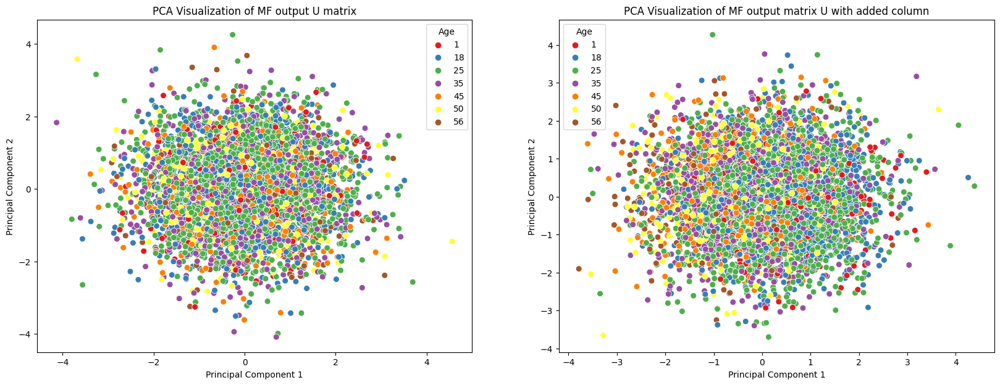

In [99]:
## without adding extra column
scaled_df = std_scaler.fit_transform(U)
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_df)

# Create a DataFrame with PCA results
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'], index=users_df['UserID'])

final_df1 = pd.concat([pca_df, users_df[['Age']]], axis=1)

## added extra age column
U_updated = np.column_stack((U, age))

# Standardize the data
std_scaler = StandardScaler()
scaled_df = std_scaler.fit_transform(U_updated)
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_df)
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'], index=users_df['UserID'])

final_df2 = pd.concat([pca_df, users_df[['Age']]], axis=1)

# Visualize using seaborn

plt.figure(figsize=(20, 7))
plt.subplot(1, 2, 1) 
sns.scatterplot(x='PC1', y='PC2', hue='Age', data=final_df1, palette='Set1', s=50)
plt.title('PCA Visualization of MF output U matrix')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

# using the updated matrix
plt.subplot(1, 2, 2) 
sns.scatterplot(x='PC1', y='PC2', hue='Age', data=final_df2, palette='Set1', s=50)
plt.title('PCA Visualization of MF output matrix U with added column')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

Regarding the age variable, we notice weaker trends. In the right plot, it can been seen that younger people information are situated on the right side of the plot (red and blue dots), while older people information are located mostly on the left side (yellow and brown dots). However, we found no noticeable trends for the remaining age groups.


### Movies

#### Genre Category

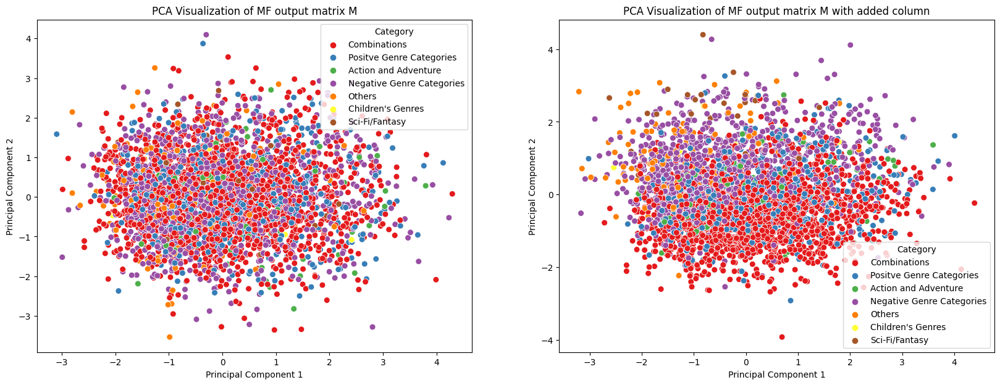

In [100]:
## without adding extra column
scaled_df = std_scaler.fit_transform(M)
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_df)

# Create a DataFrame with PCA results
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'], index=movies_df['MovieID'])

final_df1 = pd.concat([pca_df, movies_df[['Category']]], axis=1)

## added extra gender column
M_updated = np.column_stack((M, genre))

# Standardize the data
std_scaler = StandardScaler()
scaled_df = std_scaler.fit_transform(M_updated)
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_df)
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'], index=movies_df['MovieID'])

final_df2 = pd.concat([pca_df, movies_df[['Category']]], axis=1)

# Visualize using seaborn

plt.figure(figsize=(20, 7))
plt.subplot(1, 2, 1) 
sns.scatterplot(x='PC1', y='PC2', hue='Category', data=final_df1, palette='Set1', s=50)
plt.title('PCA Visualization of MF output matrix M')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

# using the updated matrix
plt.subplot(1, 2, 2) 
sns.scatterplot(x='PC1', y='PC2', hue='Category', data=final_df2, palette='Set1', s=50)
plt.title('PCA Visualization of MF output matrix M with added column')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

Here a pattern arises across the positive (blue dots) and negative (purple dots) genre groups, as we expected.

#### Decade

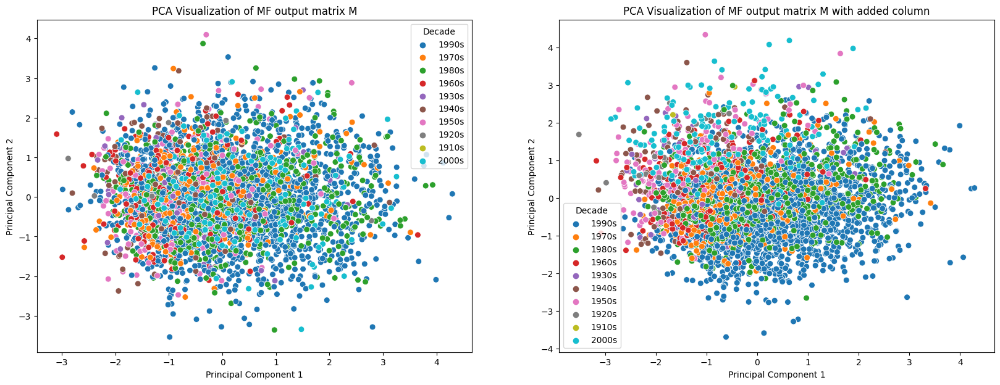

In [101]:
## without adding extra column
scaled_df = std_scaler.fit_transform(M)
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_df)

# Create a DataFrame with PCA results
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'], index=movies_df['MovieID'])

final_df1 = pd.concat([pca_df, movies_df[['Decade']]], axis=1)

## added extra gender column
M_updated = np.column_stack((M, decade))
# Standardize the data
std_scaler = StandardScaler()
scaled_df = std_scaler.fit_transform(M_updated)
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_df)
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'], index=movies_df['MovieID'])

final_df2 = pd.concat([pca_df, movies_df[['Decade']]], axis=1)

# Visualize using seaborn

plt.figure(figsize=(20, 7))
plt.subplot(1, 2, 1) 
sns.scatterplot(x='PC1', y='PC2', hue='Decade', data=final_df1, s=50)
plt.title('PCA Visualization of MF output matrix M')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

# using the updated matrix
plt.subplot(1, 2, 2) 
sns.scatterplot(x='PC1', y='PC2', hue='Decade', data=final_df2, s=50)
plt.title('PCA Visualization of MF output matrix M with added column')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

In the right plot, we can observe how the decade groups of movies released before and after 1960 are closely positioned on the upper and lower sides of the plot, respectively. More specifically, noticeable patterns emerge for movies produced in the 1990's (dark blue dots), 1980's (green dots), and 1970's (orange dots) on the lower side of the plot.

## t-SNE

### Users

#### Gender

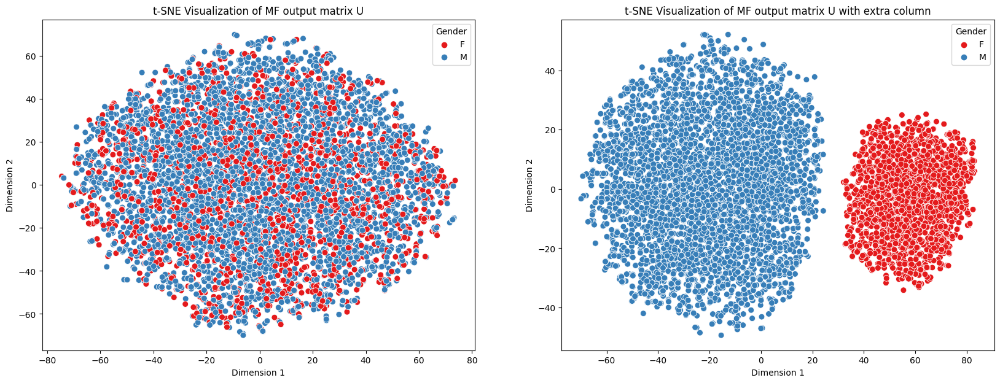

In [102]:
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(U)
tsne_df = pd.DataFrame(data=tsne_result, columns=['Dimension 1', 'Dimension 2'], index=users_df['UserID'])

final_tsne_df1 = pd.concat([tsne_df, users_df[['Gender']]], axis=1)

# using the updated matrix
U_updated = np.column_stack((U, gender))
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(U_updated)
tsne_df = pd.DataFrame(data=tsne_result, columns=['Dimension 1', 'Dimension 2'], index=users_df['UserID'])

final_tsne_df2 = pd.concat([tsne_df, users_df[['Gender']]], axis=1)

# Visualize using seaborn
# gender
plt.figure(figsize=(20, 7))
plt.subplot(1, 2, 1) 
sns.scatterplot(x='Dimension 1', y='Dimension 2', hue='Gender', data=final_tsne_df1, palette='Set1', s=50)
plt.title('t-SNE Visualization of MF output matrix U')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')

plt.subplot(1, 2, 2) 
sns.scatterplot(x='Dimension 1', y='Dimension 2', hue='Gender', data=final_tsne_df2, palette='Set1', s=50)
plt.title('t-SNE Visualization of MF output matrix U with extra column')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.show()

#### Age

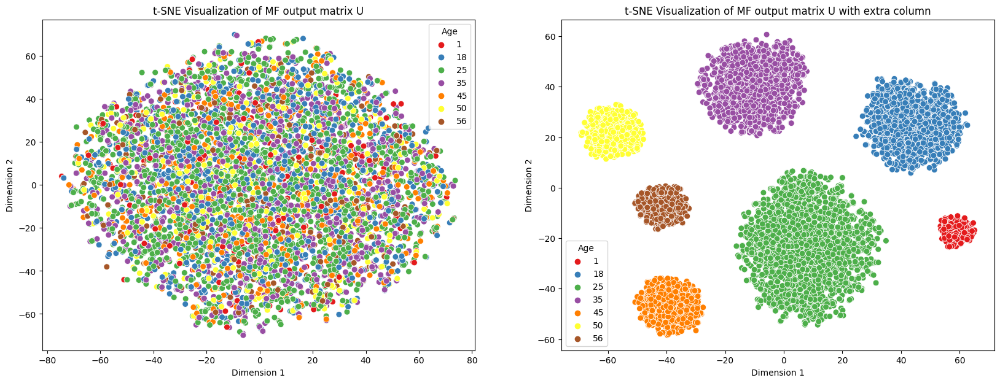

In [103]:
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(U)
tsne_df = pd.DataFrame(data=tsne_result, columns=['Dimension 1', 'Dimension 2'], index=users_df['UserID'])

final_tsne_df1 = pd.concat([tsne_df, users_df[['Age']]], axis=1)

# using the updated matrix
U_updated = np.column_stack((U, age))
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(U_updated)
tsne_df = pd.DataFrame(data=tsne_result, columns=['Dimension 1', 'Dimension 2'], index=users_df['UserID'])

final_tsne_df2 = pd.concat([tsne_df, users_df[['Age']]], axis=1)

# Visualize using seaborn
# age
plt.figure(figsize=(20, 7))
plt.subplot(1, 2, 1) 
sns.scatterplot(x='Dimension 1', y='Dimension 2', hue='Age', data=final_tsne_df1, palette='Set1', s=50)
plt.title('t-SNE Visualization of MF output matrix U')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')

plt.subplot(1, 2, 2) 
sns.scatterplot(x='Dimension 1', y='Dimension 2', hue='Age', data=final_tsne_df2, palette='Set1', s=50)
plt.title('t-SNE Visualization of MF output matrix U with extra column')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.show()


### Movies

#### Genre Category

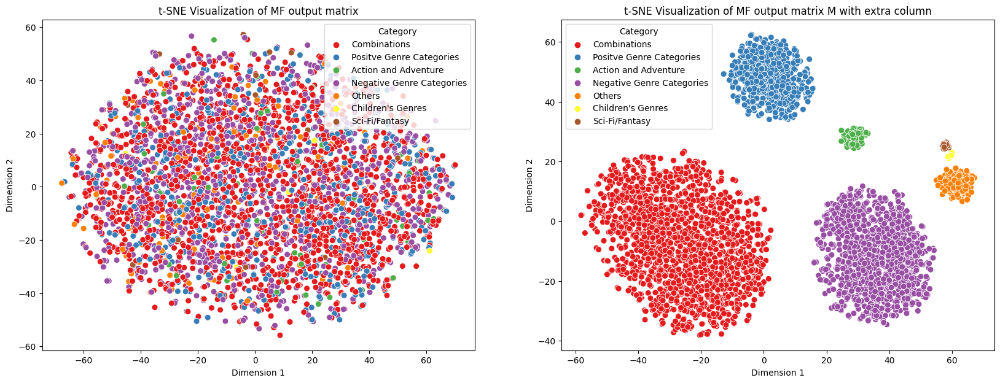

In [104]:
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(M)
tsne_df = pd.DataFrame(data=tsne_result, columns=['Dimension 1', 'Dimension 2'], index=movies_df['MovieID'])

final_tsne_df1 = pd.concat([tsne_df, movies_df[['Category']]], axis=1)

# using the updated matrix
M_updated = np.column_stack((M, genre))
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(M_updated)
tsne_df = pd.DataFrame(data=tsne_result, columns=['Dimension 1', 'Dimension 2'], index=movies_df['MovieID'])

final_tsne_df2 = pd.concat([tsne_df, movies_df[['Category']]], axis=1)

# Visualize using seaborn
# Genre Category
plt.figure(figsize=(20, 7))
plt.subplot(1, 2, 1) 
sns.scatterplot(x='Dimension 1', y='Dimension 2', hue='Category', data=final_tsne_df1, palette='Set1', s=50)
plt.title('t-SNE Visualization of MF output matrix')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')

plt.subplot(1, 2, 2) 
sns.scatterplot(x='Dimension 1', y='Dimension 2', hue='Category', data=final_tsne_df2, palette='Set1', s=50)
plt.title('t-SNE Visualization of MF output matrix M with extra column')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.show()


#### Decade

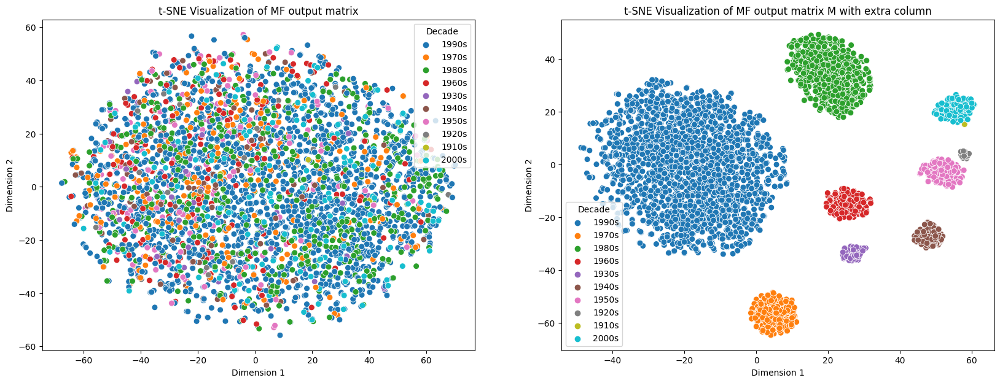

In [105]:

tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(M)
tsne_df = pd.DataFrame(data=tsne_result, columns=['Dimension 1', 'Dimension 2'], index=movies_df['MovieID'])

final_tsne_df1 = pd.concat([tsne_df, movies_df[['Decade']]], axis=1)

# using the updated matrix
M_updated = np.column_stack((M, decade))
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(M_updated)
tsne_df = pd.DataFrame(data=tsne_result, columns=['Dimension 1', 'Dimension 2'], index=movies_df['MovieID'])

final_tsne_df2 = pd.concat([tsne_df, movies_df[['Decade']]], axis=1)

# Visualize using seaborn
# Decade
plt.figure(figsize=(20, 7))
plt.subplot(1, 2, 1) 
sns.scatterplot(x='Dimension 1', y='Dimension 2', hue='Decade', data=final_tsne_df1, s=50)
plt.title('t-SNE Visualization of MF output matrix')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')

plt.subplot(1, 2, 2) 
sns.scatterplot(x='Dimension 1', y='Dimension 2', hue='Decade', data=final_tsne_df2, s=50)
plt.title('t-SNE Visualization of MF output matrix M with extra column')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.show()



## UMAP

### Users

#### Gender

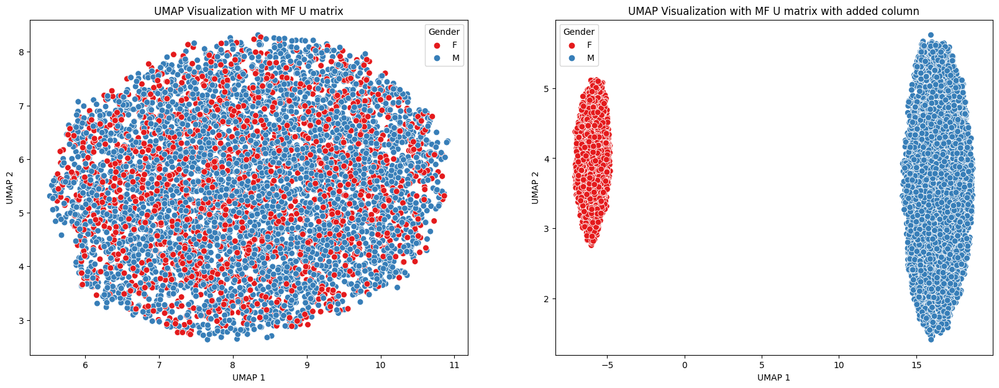

In [106]:
umap_result = umap.UMAP(n_components=2, n_neighbors=200).fit_transform(U)
umap_df = pd.DataFrame(data=umap_result, columns=['UMAP 1', 'UMAP 2'], index=users_df['UserID'])
final_umap_df1 = pd.concat([umap_df, users_df[['Gender']]], axis=1)

# using the updated matrix
U_updated = np.column_stack((U, gender))
umap_result = umap.UMAP(n_components=2, n_neighbors=200).fit_transform(U_updated)
umap_df = pd.DataFrame(data=umap_result, columns=['UMAP 1', 'UMAP 2'])

final_umap_df2 = pd.concat([umap_df, users_df[['Gender']]], axis=1)

# Visualize using seaborn
# gender
plt.figure(figsize=(20, 7))
plt.subplot(1, 2, 1) 
sns.scatterplot(x='UMAP 1', y='UMAP 2', hue='Gender', data=final_umap_df1, palette='Set1', s=50)
plt.title('UMAP Visualization with MF U matrix')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')

plt.subplot(1, 2, 2) 
sns.scatterplot(x='UMAP 1', y='UMAP 2', hue='Gender', data=final_umap_df2, palette='Set1', s=50)
plt.title('UMAP Visualization with MF U matrix with added column')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()


#### Age

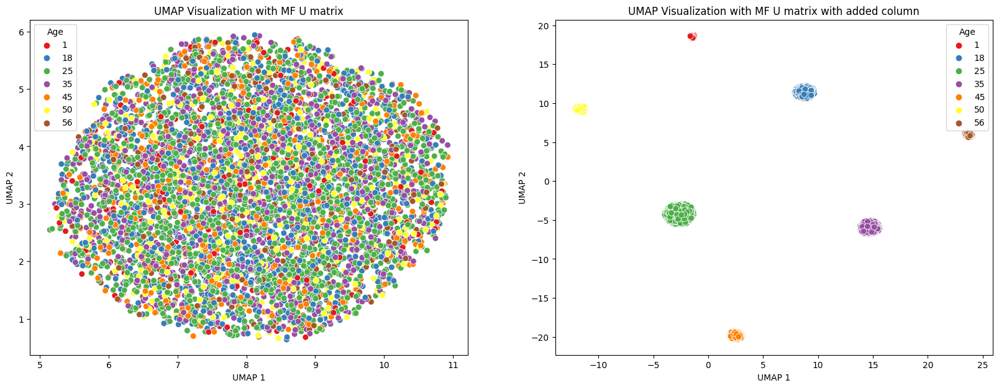

In [107]:
umap_result = umap.UMAP(n_components=2, n_neighbors=200).fit_transform(U)
umap_df = pd.DataFrame(data=umap_result, columns=['UMAP 1', 'UMAP 2'], index=users_df['UserID'])

final_umap_df1 = pd.concat([umap_df, users_df[['Age']]], axis=1)

# using the updated matrix
U_updated = np.column_stack((U, age))
umap_result = umap.UMAP(n_components=2, n_neighbors=200).fit_transform(U_updated)
umap_df = pd.DataFrame(data=umap_result, columns=['UMAP 1', 'UMAP 2'])

final_umap_df2 = pd.concat([umap_df, users_df[['Age']]], axis=1)

# Visualize using seaborn
# age
plt.figure(figsize=(20, 7))
plt.subplot(1, 2, 1) 
sns.scatterplot(x='UMAP 1', y='UMAP 2', hue='Age', data=final_umap_df1, palette='Set1', s=50)
plt.title('UMAP Visualization with MF U matrix')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')

plt.subplot(1, 2, 2) 
sns.scatterplot(x='UMAP 1', y='UMAP 2', hue='Age', data=final_umap_df2, palette='Set1', s=50)
plt.title('UMAP Visualization with MF U matrix with added column')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()


### Movies

#### Genres

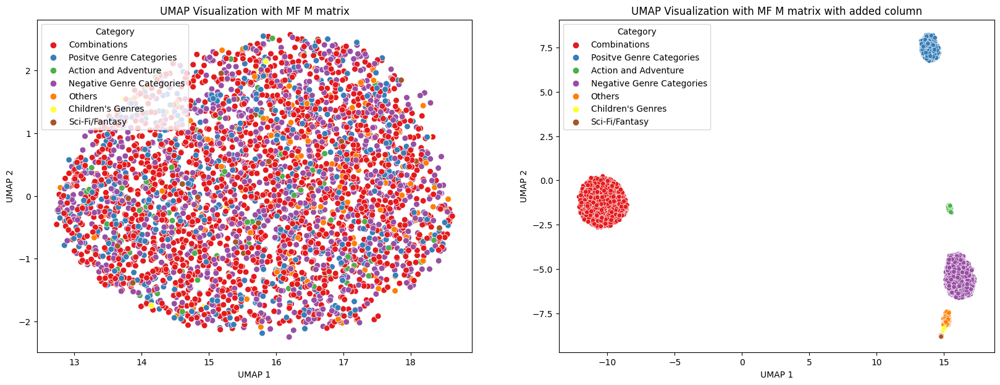

In [111]:
umap_result = umap.UMAP(n_components=2, n_neighbors=200).fit_transform(M)
umap_df = pd.DataFrame(data=umap_result, columns=['UMAP 1', 'UMAP 2'], index=movies_df['MovieID'])

final_umap_df1 = pd.concat([umap_df, movies_df[['Category']]], axis=1)

# using the updated matrix
M_updated = np.column_stack((M, genre))
umap_result = umap.UMAP(n_components=2, n_neighbors=200).fit_transform(M_updated)
umap_df = pd.DataFrame(data=umap_result, columns=['UMAP 1', 'UMAP 2'])

final_umap_df2 = pd.concat([umap_df, movies_df[['Category']]], axis=1)

# Visualize using seaborn
# genre
plt.figure(figsize=(20, 7))
plt.subplot(1, 2, 1) 
sns.scatterplot(x='UMAP 1', y='UMAP 2', hue='Category', data=final_umap_df1, palette='Set1', s=50)
plt.title('UMAP Visualization with MF M matrix')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')

plt.subplot(1, 2, 2) 
sns.scatterplot(x='UMAP 1', y='UMAP 2', hue='Category', data=final_umap_df2, palette='Set1', s=30) # we experiment with s a little bit
plt.title('UMAP Visualization with MF M matrix with added column')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()


#### Decade

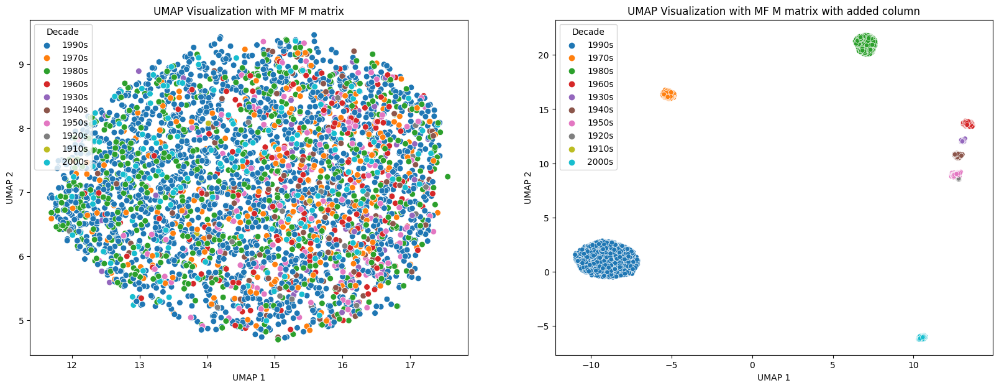

In [110]:
umap_result = umap.UMAP(n_components=2, n_neighbors=200).fit_transform(M)
umap_df = pd.DataFrame(data=umap_result, columns=['UMAP 1', 'UMAP 2'], index=movies_df['MovieID'])

final_umap_df1 = pd.concat([umap_df, movies_df[['Decade']]], axis=1)

# using the updated matrix
M_updated = np.column_stack((M, decade))
umap_result = umap.UMAP(n_components=2, n_neighbors=200).fit_transform(M_updated)
umap_df = pd.DataFrame(data=umap_result, columns=['UMAP 1', 'UMAP 2'])

final_umap_df2 = pd.concat([umap_df, movies_df[['Decade']]], axis=1)

# Visualize using seaborn
# decade
plt.figure(figsize=(20, 7))
plt.subplot(1, 2, 1) 
sns.scatterplot(x='UMAP 1', y='UMAP 2', hue='Decade', data=final_umap_df1, s=50)
plt.title('UMAP Visualization with MF M matrix')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')

plt.subplot(1, 2, 2) 
sns.scatterplot(x='UMAP 1', y='UMAP 2', hue='Decade', data=final_umap_df2, s=30)
plt.title('UMAP Visualization with MF M matrix with added column')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()
